# DeepFake Detection using Deep Learning

## Requirments

The required libraries and package are as follows:
<ul>
    <li>Tensorflow 2.6 - A machine learning framework which can help model ML architectures quickly and also provides hardware acceleration for training</li>
    <li>Dlib -  An opensource Data Science framework with many pretrained models for data analysis and facial detection</li>
    <li>OpenCV - Image manipulation package required to handle the video dataset</li>
    <li>Matplotlib - Graphing and plotting library used for plotting the model metrics</li>
    <li>Pandas - Used to handle the metadata for the training dataset</li>
    <li>Numpy - Used to handle the dataset for the machine learning models in the form of vectors and arrays</li>
    <li>ImageIO - Another image handling library used for the dataset</li>
    <li>SKlearn - Data analysis framework used to generate the training, testing and validation split for the data</li>
</ul>

Additional requirements for Dlib:
<ul>
    <li>GCC compile version 6.3.0</li>
    <li>Visual studio 16 2019</li>
    <li>Cmake 3.4.0</li>
<ul>

The commands to install and verify the installation are given (Make sure to open jupyter-lab in adminstative mode to install the dependencies):

In [ ]:
# %pip install -U --upgrade tensorflow==2.6
# %pip install -U opencv-python
# %pip install -U matplotlib
# %pip install -U pandas
# %pip install -U numpy
# %pip install -U imageio
# %pip install -U sklearn
# %pip install -U cmake
# %pip install -U dlib

In [ ]:
#%pip list

Import the packages and test whether tensorflow and dlib are utilising the GPU or not

In [1]:
from tensorflow import keras
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import imageio
import cv2
import os
from IPython.display import HTML
from base64 import b64encode
import dlib
import re
import json
from random import *
from pylab import *
from PIL import Image, ImageChops, ImageEnhance

In [2]:
print(tf.test.gpu_device_name())
print(dlib.DLIB_USE_CUDA)

/device:GPU:0
True


## Data Visualization and analysis

Read the data from the sample training set

In [3]:
DATA_FOLDER = ''
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")

Train samples: 402


Analyise the metadata

In [4]:
train_sample_metadata = pd.read_json(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, 'metadata.json')).T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


Analyise the distribution of real and fake videos

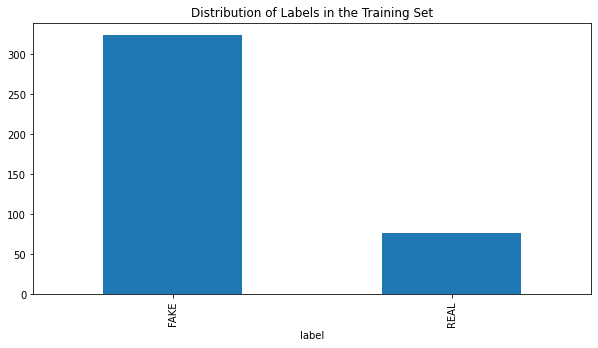

label
FAKE    323
REAL     77
Name: label, dtype: int64

In [5]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(10, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()
train_sample_metadata.groupby('label')['label'].count()

In [6]:
train_sample_metadata.shape

(400, 3)

A sample of fake videos from the training dataset which will be used to feed the inception network with the input data

In [7]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
fake_train_sample_video

['esyhwdfnxs.mp4', 'dzvyfiarrq.mp4', 'dqzreruvje.mp4']

An auxilary function to read the frames from the video dataset

In [8]:
def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

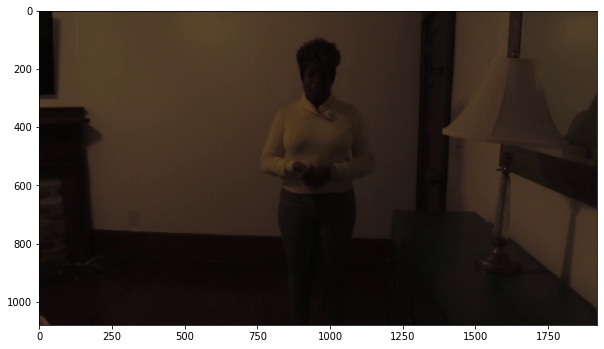

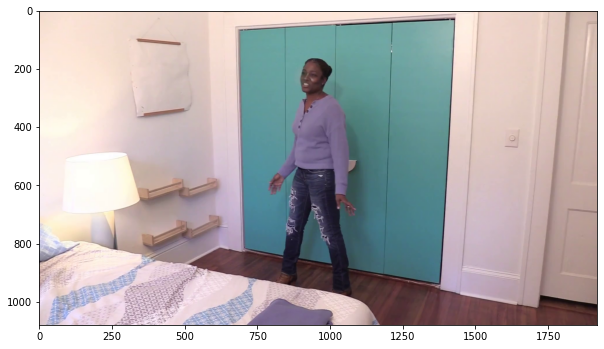

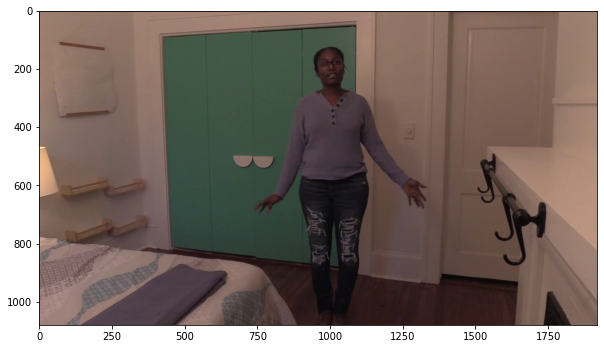

In [9]:
for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

A sample of real videos from the training dataset

In [10]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)
real_train_sample_video

['axntxmycwd.mp4', 'ehccixxzoe.mp4', 'ecujsjhscd.mp4']

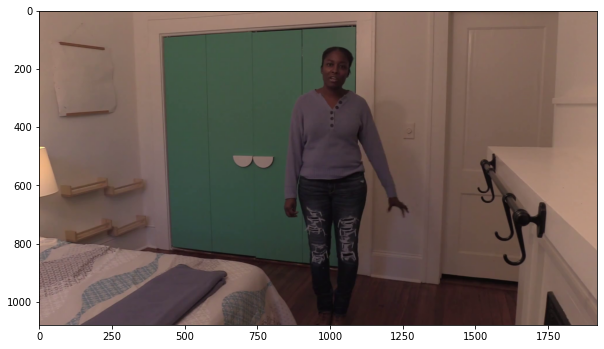

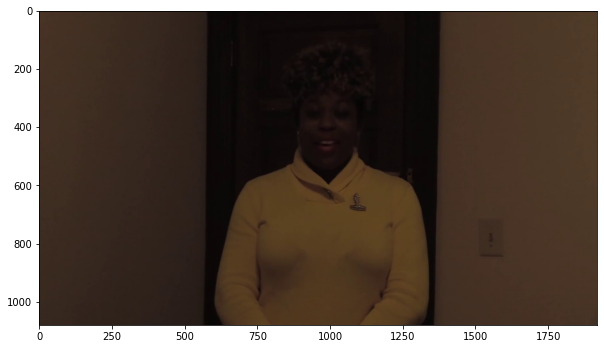

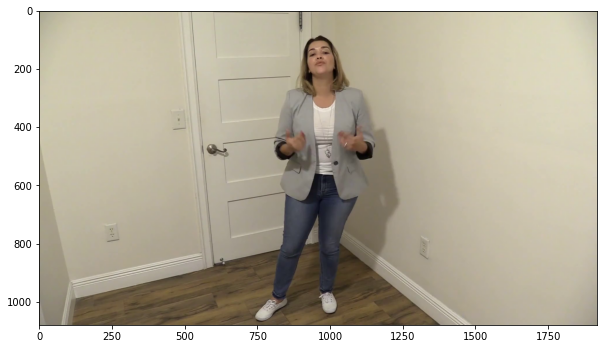

In [11]:
for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

Value count of the deepfake videos generated from the real videos

In [11]:
train_sample_metadata['original'].value_counts()[0:5]

atvmxvwyns.mp4    6
meawmsgiti.mp4    6
qeumxirsme.mp4    5
kgbkktcjxf.mp4    5
fysyrqfguw.mp4    4
Name: original, dtype: int64

In [12]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')

<Figure size 432x288 with 0 Axes>

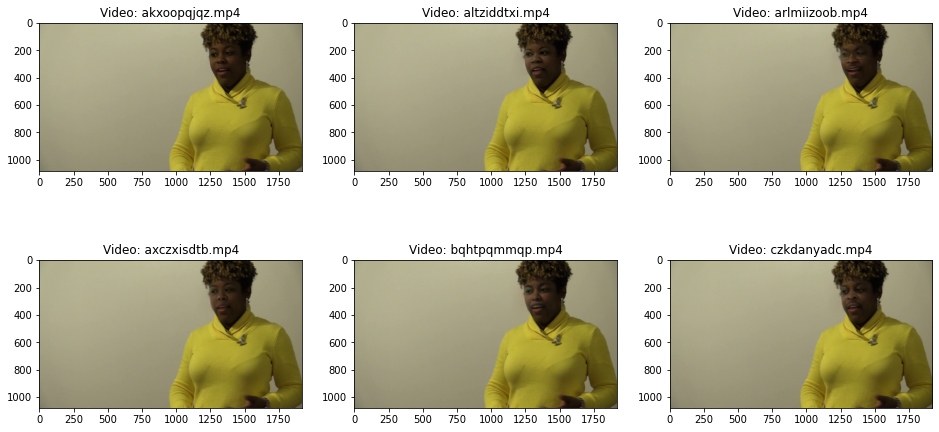

In [13]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='meawmsgiti.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

Auxilary function to play the video which will be used to visaully check if a video is real or not

In [14]:
fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [15]:
def play_video(folder, video_file, subset):
    video_url = open(os.path.join(folder, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(DATA_FOLDER, fake_videos[10], TRAIN_SAMPLE_FOLDER)

### Facial Detection using an MMOD based CNN 

The first step of Data Augmentation is to extract the facial images from the each of the videos to use as inputs to the model. For this purpose the Dlib library is used which uses a Max Margin Object Detection model with Convolutional Neural Networks. We first load all the videos and start extracting only 10 frames from each video to save space. The output is stored in a dataset folder segregated with respect to real or fake values. 

cbbibzcoih.mp4


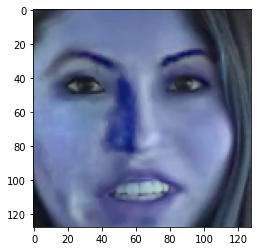

1


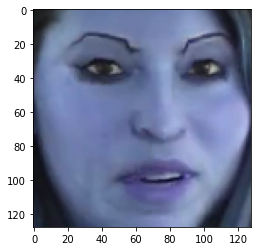

2


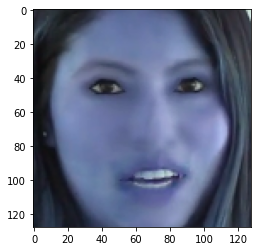

3


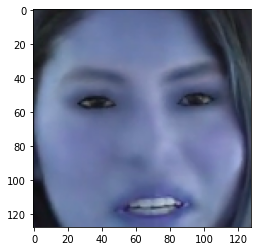

4


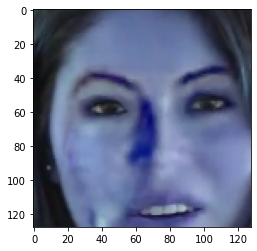

5


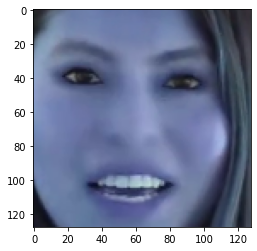

6


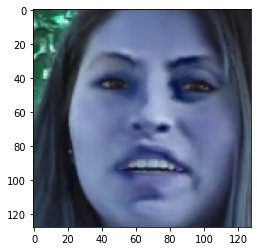

7


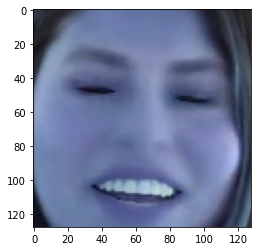

8


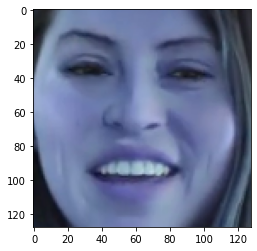

9


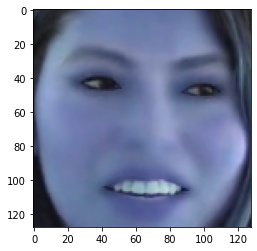

10


In [16]:
detector = dlib.cnn_face_detection_model_v1('mmod_human_face_detector.dat')
vid = 'cbbibzcoih.mp4'
print(vid)
cap = cv2.VideoCapture(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, vid))
frameRate = cap.get(5)
count = 0
while cap.isOpened():
    frameId = cap.get(1)
    ret, frame = cap.read()
    if ret != True:
        break
    if frameId % ((int(frameRate)+1)*1) == 0:
        face_rects = detector(frame, 1)
        for i, d in enumerate(face_rects):
            x1 = d.rect.left()
            y1 = d.rect.top()
            x2 = d.rect.right()
            y2 = d.rect.bottom()
            crop_img = frame[y1:y2, x1:x2]
            plt.imshow(cv2.resize(crop_img, (128, 128)))
            plt.show()
            count += 1
            print(count)

# Model Architecture and Training

In [1]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix

## Declaring constants

We set the image size as 128 x 128 shape with rgb color values. Also training batch of size 32 is used.

In [2]:
img_shape = 128
input_shape = (img_shape, img_shape, 3)
EPOCHS = 50
BATCH_SIZE = 32

## Training Pipeline

Due to the huge size of the dataset, the entire dataset cannot be fit directly on the memory so a data pipeline is used to feed the training data to the model. The Tensorflow Data API gives us the tools required to build the pipeline for training, validation and testing data. The pipeline reads the data from the disk sequentially and uses mapping functions to convert the data into suitable forms to be processed by the model. The mapped values can then be cached to reduce I/O times. We also use parallel processing to better utilize the CPU to prepare the next training batch while the GPU keeps itself busy training the model.

In [3]:
def process_path(file_path):
    label = tf.strings.split(file_path, os.path.sep)[-2]
    label_arr = None
    if label == 'fake':
        label_arr = 0
    else:
        label_arr = 1
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img)
    img = tf.image.resize(img, [img_shape, img_shape])
    img = tf.image.convert_image_dtype(img, tf.float32)
    return (img, label_arr)

def scale(image, label):
    return (image / 255, label)

train_ds = tf.data.Dataset.list_files('1framedfd/dataset/train/*/*')
test_ds = tf.data.Dataset.list_files('1framedfd/dataset/test/*/*')
val_ds = tf.data.Dataset.list_files('1framedfd/dataset/valid/*/*')

train_size = len(train_ds)
val_size = len(val_ds)

train_ds = train_ds.shuffle(train_size).map(process_path, num_parallel_calls = tf.data.AUTOTUNE).map(scale, num_parallel_calls = tf.data.AUTOTUNE).batch(BATCH_SIZE).repeat(EPOCHS).prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(val_size).map(process_path, num_parallel_calls = tf.data.AUTOTUNE).map(scale, num_parallel_calls = tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.shuffle(val_size).map(process_path, num_parallel_calls = tf.data.AUTOTUNE).map(scale, num_parallel_calls = tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

## Model Architecture

In [4]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Conv2D, BatchNormalization, Input, LeakyReLU, Concatenate
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import InputLayer, Rescaling
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

The main component of the ML model includes a highly dense Convolutional Neural Network called an InceptionResNetV2. It consists of a combination of multiple Inception Blocks and Residual Connections which makes the entire network very deep and very efficient to learn various features fast. This is why it used a feature detection block of the entire model. The output features produced by the feature detector is the fed to the Dense Layers which output a single neuron output as a probability of the image being real.

InceptionResNetV2 Diagram
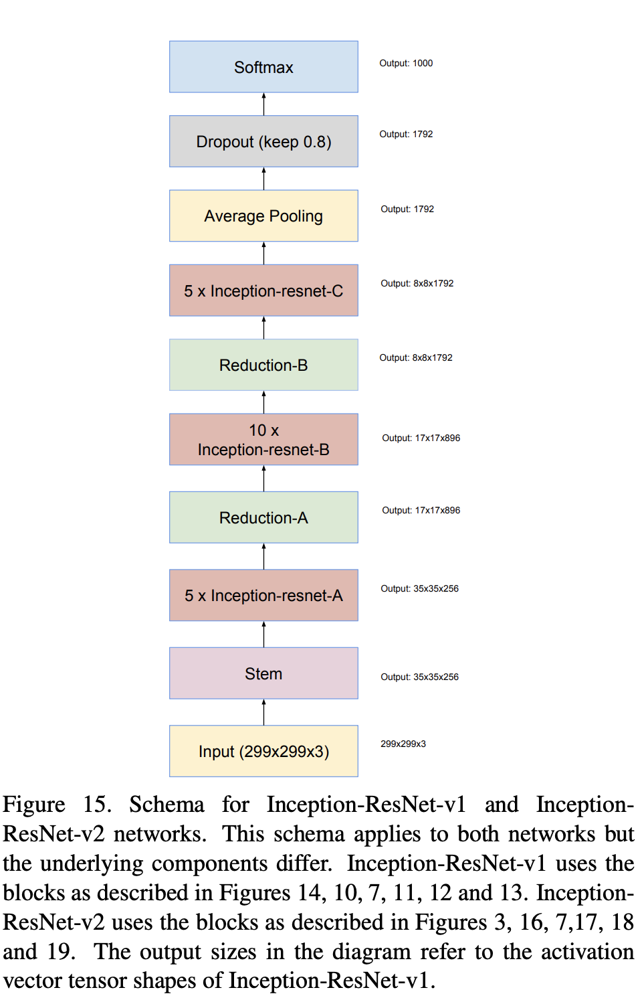

InceptionResNetV2-A Diagram
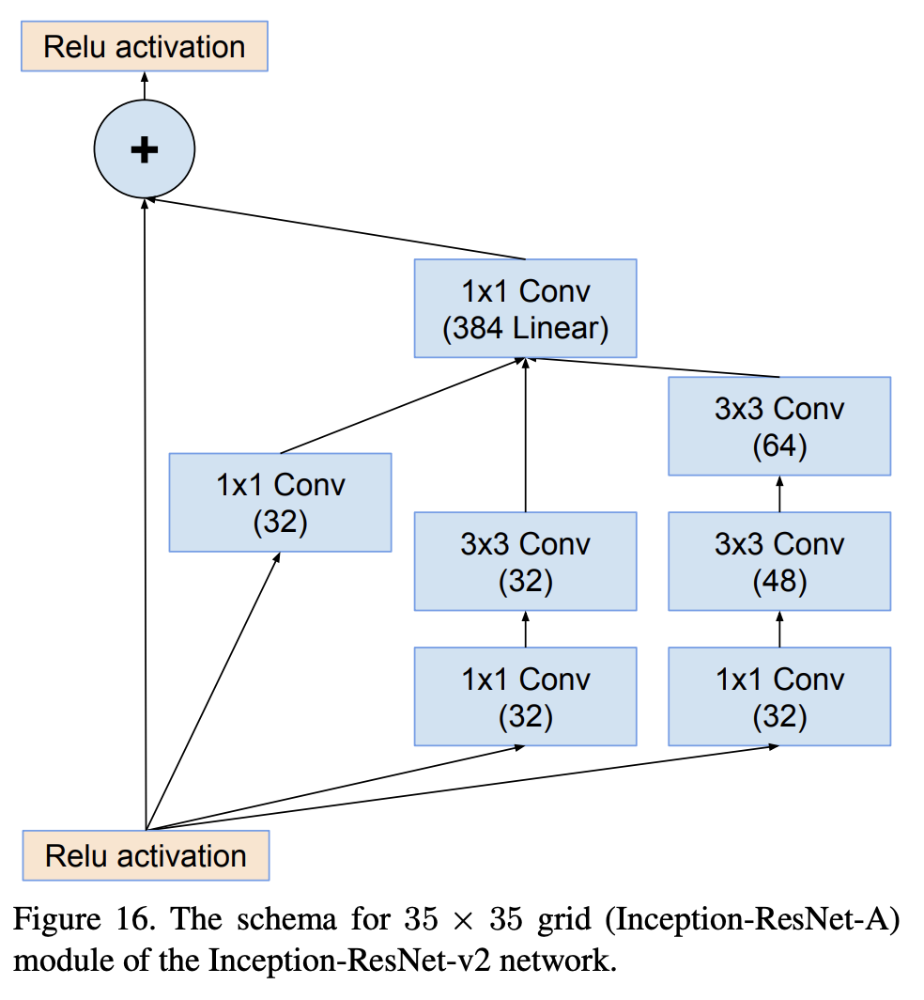

InceptionResNetV2-B Diagram
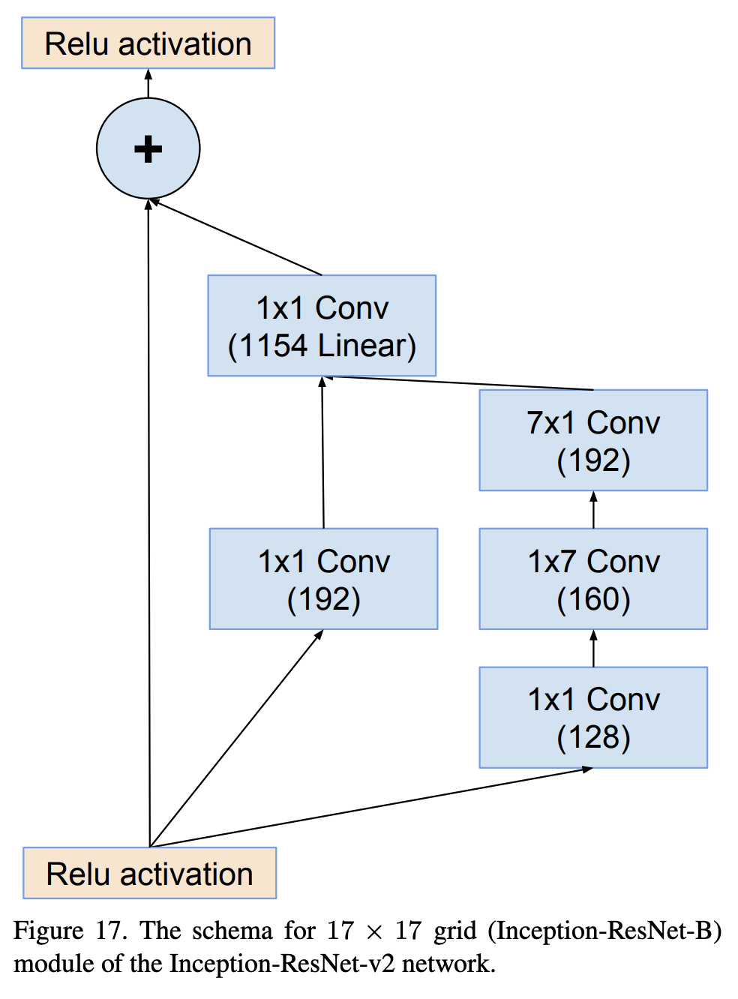

InceptionResNetV2-C Diagram
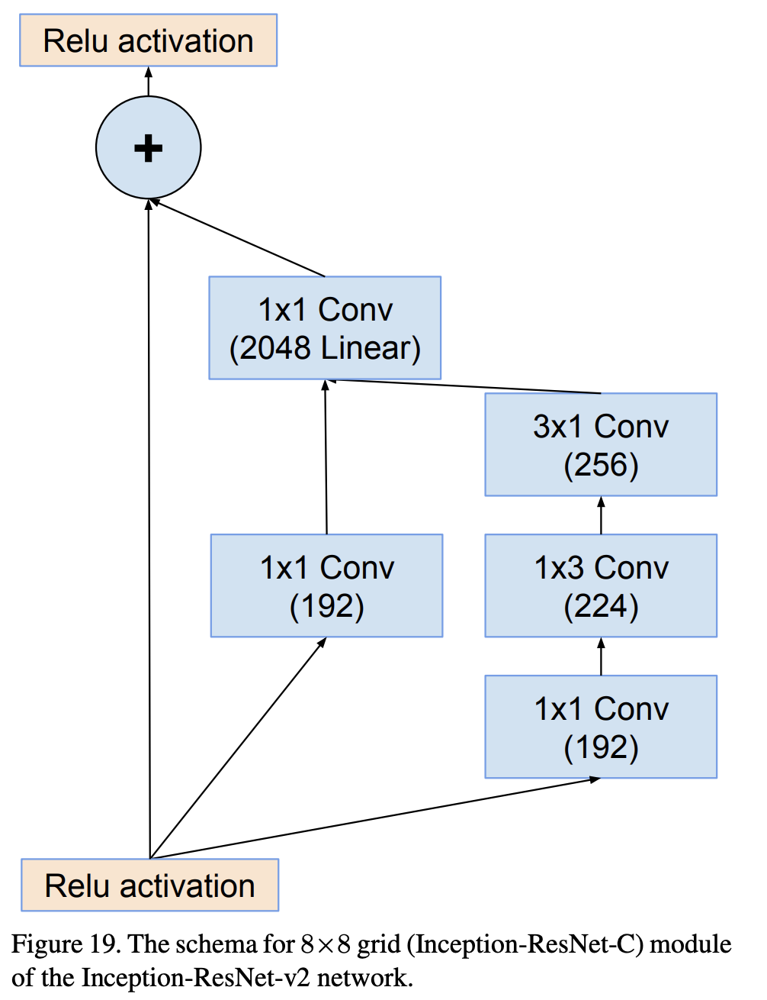

In [ ]:
inception_resnet = InceptionResNetV2(include_top = False, weights = 'imagenet', input_shape = input_shape)
inception_resnet.trainable = True
model = Sequential()
model.add(inception_resnet)
model.add(GlobalAveragePooling2D())
model.add(Dense(units = 16, activation = 'relu'))
model.add(Dense(units = 1, activation = 'sigmoid'))

In [6]:
model.compile(loss = 'binary_crossentropy', optimizer = optimizers.Adam(learning_rate = 1e-3), metrics = ['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Functio (None, 2, 2, 1536)        54336736  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 16)                24592     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 54,361,345
Trainable params: 54,300,801
Non-trainable params: 60,544
_________________________________________________________________


## Training on Nvidia Nvidia Flickr Datasrt

In [8]:
checkpoint_callback = ModelCheckpoint(
    filepath = 'checkpoints/best_dfd_inception_resnet_nvidia.hdf5',
    monitor = 'val_loss',
    verbose = 1,
    save_best_only = True,
    mode = 'min')

reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', 
                              factor = 0.2,
                              patience = 3, 
                              min_lr = 0.0001)

STEPS = train_size // BATCH_SIZE
callbacks = [checkpoint_callback, reduce_lr]
history = model.fit(train_ds, batch_size = BATCH_SIZE, steps_per_epoch = STEPS, epochs = EPOCHS, callbacks = callbacks, validation_data = val_ds, verbose = 1)

Epoch 1/10
3125/3125 [==============================] - 667s 213ms/step - loss: 0.1559 - accuracy: 0.9370 - val_loss: 0.3606 - val_accuracy: 0.8791

Epoch 00001: val_loss improved from inf to 0.36062, saving model to checkpoints\best_dfd_inception_resnet_nvidia.hdf5
Epoch 2/10
3125/3125 [==============================] - 689s 221ms/step - loss: 0.0661 - accuracy: 0.9755 - val_loss: 0.1317 - val_accuracy: 0.9489

Epoch 00002: val_loss improved from 0.36062 to 0.13166, saving model to checkpoints\best_dfd_inception_resnet_nvidia.hdf5
Epoch 3/10
3125/3125 [==============================] - 681s 218ms/step - loss: 0.0410 - accuracy: 0.9849 - val_loss: 0.0603 - val_accuracy: 0.9798

Epoch 00003: val_loss improved from 0.13166 to 0.06032, saving model to checkpoints\best_dfd_inception_resnet_nvidia.hdf5
Epoch 4/10
3125/3125 [==============================] - 684s 219ms/step - loss: 0.0290 - accuracy: 0.9893 - val_loss: 0.1412 - val_accuracy: 0.9528

Epoch 00004: val_loss did not improve from

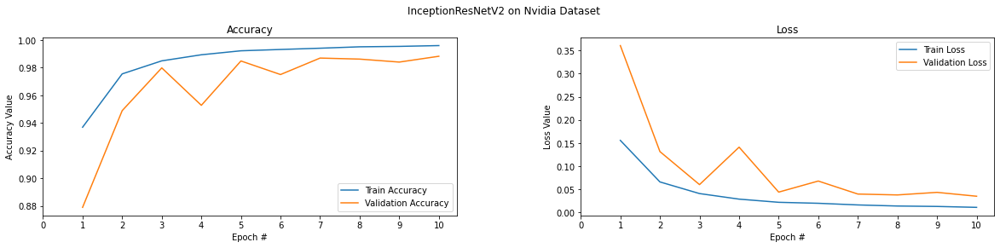

In [9]:
model.save('models/dfd_model_nvidia_data.hdf5')

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 4))
t = f.suptitle('InceptionResNetV2 on Nvidia Dataset', fontsize = 12)
f.subplots_adjust(top = 0.85, wspace = 0.3)

epoch_list = list(range(1, EPOCHS + 1))
ax1.plot(epoch_list, history.history['accuracy'], label = 'Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label = 'Validation Accuracy')
ax1.set_xticks(np.arange(0, EPOCHS + 1, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch #')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label = 'Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label = 'Validation Loss')
ax2.set_xticks(np.arange(0, EPOCHS + 1, 1))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch #')
ax2.set_title('Loss')
l2 = ax2.legend(loc = "best")

In [10]:
results = model.evaluate(test_ds)
print(model.metrics_names)
print(results)

625/625 [==============================] - 44s 70ms/step - loss: 0.0340 - accuracy: 0.9886
['loss', 'accuracy']
[0.03398340195417404, 0.9886000156402588]


## Training on Kaggle Deepfake Detection Dataset

In [7]:
checkpoint_callback = ModelCheckpoint(
    filepath = 'checkpoints/best_dfd_inception_resnet_1framedfd.hdf5',
    monitor = 'val_loss',
    verbose = 1,
    save_best_only = True,
    mode = 'min')

reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', 
                              factor = 0.2,
                              patience = 3,
                              verbose = 1,
                              min_lr = 0.0001)

STEPS = train_size // BATCH_SIZE
callbacks = [checkpoint_callback, reduce_lr]
history = model.fit(train_ds, batch_size = BATCH_SIZE, steps_per_epoch = STEPS, epochs = EPOCHS, callbacks = callbacks, validation_data = val_ds, verbose = 1)

Epoch 1/50
2390/2390 [==============================] - 508s 205ms/step - loss: 0.3795 - accuracy: 0.8369 - val_loss: 0.3837 - val_accuracy: 0.8541

Epoch 00001: val_loss improved from inf to 0.38367, saving model to checkpoints\best_dfd_inception_resnet_1framedfd.hdf5
Epoch 2/50
2390/2390 [==============================] - 493s 206ms/step - loss: 0.4000 - accuracy: 0.8398 - val_loss: 1.5229 - val_accuracy: 0.8297

Epoch 00002: val_loss did not improve from 0.38367
Epoch 3/50
2390/2390 [==============================] - 492s 206ms/step - loss: 0.4208 - accuracy: 0.8321 - val_loss: 0.4661 - val_accuracy: 0.8332

Epoch 00003: val_loss did not improve from 0.38367
Epoch 4/50
2390/2390 [==============================] - 493s 206ms/step - loss: 0.4099 - accuracy: 0.8370 - val_loss: 0.8974 - val_accuracy: 0.8458

Epoch 00004: val_loss did not improve from 0.38367

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
Epoch 5/50
2390/2390 [==========================

INFO:tensorflow:Assets written to: models/dfd_model_1framedfd\assets


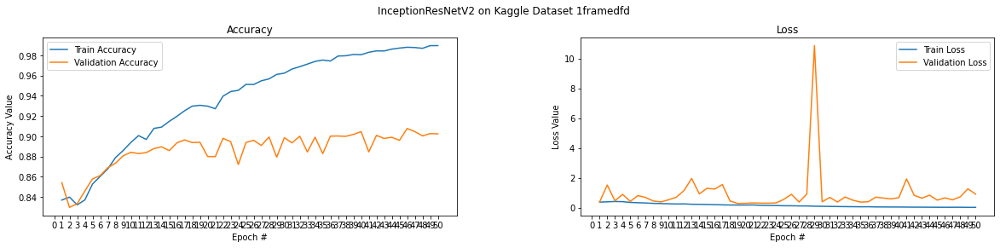

In [10]:
model.save('models/dfd_model_1framedfd')

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 4))
t = f.suptitle('InceptionResNetV2 on Kaggle Dataset 1framedfd', fontsize = 12)
f.subplots_adjust(top = 0.85, wspace = 0.3)

epoch_list = list(range(1, EPOCHS + 1))
ax1.plot(epoch_list, history.history['accuracy'], label = 'Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label = 'Validation Accuracy')
ax1.set_xticks(np.arange(0, EPOCHS + 1, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch #')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label = 'Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label = 'Validation Loss')
ax2.set_xticks(np.arange(0, EPOCHS + 1, 1))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch #')
ax2.set_title('Loss')
l2 = ax2.legend(loc = "best")

In [9]:
results = model.evaluate(test_ds)
print(model.metrics_names)
print(results)

299/299 [==============================] - 20s 68ms/step - loss: 1.6127 - accuracy: 0.9009
['loss', 'accuracy']
[1.6126697063446045, 0.9008679389953613]


# Inference

The model's performance is evaluated by randomly sampling a set of 128 test images and using the model to predict the labels. The predictions are then mapped into a confusion matrix to evaluate other metrics:
<ul>
    <li>Precision - Precision is a metric that quantifies the number of correct positive predictions made.</li>
    <li>Recall - Recall is a metric that quantifies the number of correct positive predictions made out of all positive predictions that could have been made.</li>
    <li>Fscore - F-Measure provides a way to combine both precision and recall into a single measure that captures both properties.</li>
</ul>

## Inference on Nvidia Dataset

True positive =  128
False positive =  0
False negative =  3
True negative =  125
Precision =  1.0
Recall =  0.9770992366412213
Fscore =  0.9884169884169884




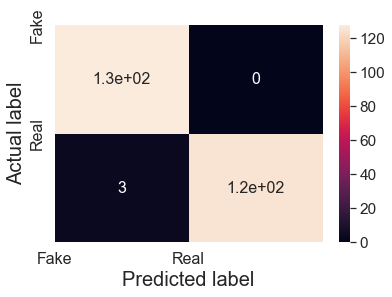

In [3]:
#Output confusion matrix
def print_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tp = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tn = cm[1][1]
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    fscore = (2 * precision * recall) / (precision + recall)
    print('True positive = ', tp)
    print('False positive = ', fp)
    print('False negative = ', fn)
    print('True negative = ', tn)
    print('Precision = ', precision)
    print('Recall = ', recall)
    print('Fscore = ', fscore)
    print('\n')
    df_cm = pd.DataFrame(cm, range(2), range(2))
    sn.set(font_scale=1.4) # for label size
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
    plt.ylabel('Actual label', size = 20)
    plt.xlabel('Predicted label', size = 20)
    plt.xticks(np.arange(2), ['Fake', 'Real'], size = 16)
    plt.yticks(np.arange(2), ['Fake', 'Real'], size = 16)
    plt.ylim([2, 0])
    plt.show()
    
def process_path(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img)
    img = tf.image.resize(img, [img_shape, img_shape])
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img

def scale(image):
    return (image / 255)
    
model = load_model('models/dfd_model_nvidia_dataset')
data_dir = '140K/dataset/real-vs-fake/test/'
real_data = [f for f in os.listdir(data_dir+'/real') if f.endswith('.jpg')]
fake_data = [f for f in os.listdir(data_dir+'/fake') if f.endswith('.jpg')]
real_data = random.sample(real_data, 128)
fake_data = random.sample(fake_data, 128)
X = []
Y = []
for img in real_data:
    res = scale(process_path(data_dir+'/real/'+img))
    X.append(res)
    Y.append(1)
for img in fake_data:
    res = scale(process_path(data_dir+'/fake/'+img))
    X.append(res)
    Y.append(0)
X = np.array(X)
X = X.reshape(-1, 128, 128, 3)
Y_true = Y
Y_pred = model.predict(X)

print_confusion_matrix(Y_true, np.round(Y_pred))

## Inference on Kaggle Dataset

True positive =  120
False positive =  8
False negative =  45
True negative =  83
Precision =  0.9375
Recall =  0.7272727272727273
Fscore =  0.8191126279863482




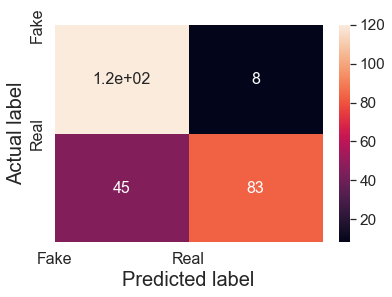

In [3]:
#Output confusion matrix
def print_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tp = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tn = cm[1][1]
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    fscore = (2 * precision * recall) / (precision + recall)
    print('True positive = ', tp)
    print('False positive = ', fp)
    print('False negative = ', fn)
    print('True negative = ', tn)
    print('Precision = ', precision)
    print('Recall = ', recall)
    print('Fscore = ', fscore)
    print('\n')
    df_cm = pd.DataFrame(cm, range(2), range(2))
    sn.set(font_scale=1.4) # for label size
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size
    plt.ylabel('Actual label', size = 20)
    plt.xlabel('Predicted label', size = 20)
    plt.xticks(np.arange(2), ['Fake', 'Real'], size = 16)
    plt.yticks(np.arange(2), ['Fake', 'Real'], size = 16)
    plt.ylim([2, 0])
    plt.show()
    
def process_path(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img)
    img = tf.image.resize(img, [img_shape, img_shape])
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img

def scale(image):
    return (image / 255)
    
model = load_model('models/dfd_model_1framedfd')
data_dir = '1framedfd/dataset/test'
real_data = [f for f in os.listdir(data_dir+'/real') if f.endswith('.jpg')]
fake_data = [f for f in os.listdir(data_dir+'/fake') if f.endswith('.jpg')]
real_data = random.sample(real_data, 128)
fake_data = random.sample(fake_data, 128)
X = []
Y = []
for img in real_data:
    res = scale(process_path(data_dir+'/real/'+img))
    X.append(res)
    Y.append(1)
for img in fake_data:
    res = scale(process_path(data_dir+'/fake/'+img))
    X.append(res)
    Y.append(0)
X = np.array(X)
X = X.reshape(-1, 128, 128, 3)
Y_true = Y
Y_pred = model.predict(X)

print_confusion_matrix(Y_true, np.round(Y_pred))